# Generating New Images

This section highlights the application of the trained Pix2Pix model in generating satellite imagery from new land cover data. By utilizing unseen land cover inputs, the model can simulate realistic satellite views for various scenarios, such as urban expansion or ecological changes. Modifications to land cover data, like increasing developed areas, allow the creation of satellite images reflecting potential future landscapes. This demonstrates the model’s utility in supporting land-use planning and decision-making processes.

## Step 1

<strong style="color: #CD6AA3;">Like what we did in "Data Acquisition" section,</strong> we can use the same code chunks to fetch another set of random points and corresponding images, to serve as our new testing dataset:

In [16]:
#| code-fold: true

import os
import json
from PIL import Image
import matplotlib.pyplot as plt

In [1]:
coords_test = 'data/coords/coords_test.json'

In [6]:
if os.path.exists(coords_test):
    with open(coords_test, 'r') as f:
        coords_test_points = json.load(f)
    print(f"Loaded {len(coords_test_points)} coordinates from {coords_test}")
else:
    num_points = 1000
    coords_test_points = generate_random_points_all(aoi1_geometry, aoi2_geometry, num_points)
    with open(coords_test, 'w') as f:
        json.dump(coords_test_points, f)
    print(f"Generated and saved {len(coords_test_points)} coordinates to {coords_test}")

Loaded 1000 coordinates from data/coords/coords_test.json


In [ ]:
#| eval: false

true_color_dir_test = '24-1204_training_images_2/RC_test'
land_cover_dir_test = '24-1204_training_images_2/LC_test'
os.makedirs(true_color_dir_test, exist_ok=True)
os.makedirs(land_cover_dir_test, exist_ok=True)

def process_point_test(idx, coord):
    lat = coord['latitude']
    lon = coord['longitude']
    point = ee.Geometry.Point(lon, lat)
    print(lat, lon)

    img_size = 1024
    pixel_scale = 10 
    buffer_size = (img_size / 2) * pixel_scale  
    region = point.buffer(buffer_size).bounds()

    collection = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
        .filterBounds(point) \
        .filterDate('2022-01-01', '2022-12-31') \
        .sort('CLOUD_COVER') \
        .limit(1)

    image = collection.first()
    if image is None:
        print(f"No true-color image found for point {idx+1}")
    else:
        image_rgb = image.select(['B4', 'B3', 'B2'])
        vis_params_rgb = {
            'min': 0,
            'max': 0.3,
        }

        thumbnail_rgb = image_rgb.getThumbURL({
            'region': region,
            'dimensions': [img_size, img_size],
            'format': 'png',
            'crs': 'EPSG:3857',
            'min': vis_params_rgb['min'],
            'max': vis_params_rgb['max'],
        })

        response_rgb = requests.get(thumbnail_rgb)
        if response_rgb.status_code == 200:
            image_path_rgb = os.path.join(true_color_dir_test, f'image_{idx}.png')
            with open(image_path_rgb, 'wb') as f:
                f.write(response_rgb.content)
            print(f"Downloaded true-color image {idx+1}/{len(coords_test_points)} to {image_path_rgb}")
        else:
            print(f"Failed to download true-color image {idx+1}: HTTP {response_rgb.status_code}")

    landcover = ee.Image('ESA/WorldCover/v100/2020')

    image_lc = landcover.clip(region)

    vis_params_lc = {
        'min': 10,
        'max': 100,
        'palette': [
            '006400',  # Tree cover (10): Dark Green
            'ffbb22',  # Shrubland (20): Orange
            'ffff4c',  # Grassland (30): Yellow
            'f096ff',  # Cropland (40): Pink
            'fa0000',  # Built-up (50): Red
            'b4b4b4',  # Bare/sparse vegetation (60): Grey
            'f0f0f0',  # Snow and ice (70): White
            '0064c8',  # Permanent water bodies (80): Blue
            '0096a0',  # Herbaceous wetland (90): Teal
            '00cf75',  # Mangroves (95): Light Green
            'fae6a0',  # Moss and lichen (100): Beige
        ]
    }

    thumbnail_lc = image_lc.getThumbURL({
        'region': region,
        'dimensions': [img_size, img_size],
        'format': 'png',
        'crs': 'EPSG:3857',
        'min': vis_params_lc['min'],
        'max': vis_params_lc['max'],
        'palette': vis_params_lc['palette'],
    })

    response_lc = requests.get(thumbnail_lc)
    if response_lc.status_code == 200:
        image_path_lc = os.path.join(land_cover_dir_test, f'image_{idx}.png')
        with open(image_path_lc, 'wb') as f:
            f.write(response_lc.content)
        print(f"Downloaded land cover image {idx+1}/{len(coords_test_points)} to {image_path_lc}")
    else:
        print(f"Failed to download land cover image {idx+1}: HTTP {response_lc.status_code}")

for idx, coord in enumerate(coords_test_points):
    try:
        process_point_test(idx, coord)
    except Exception as e:
        print(f"An error occurred at point {idx+1}: {e}")
        continue

In [ ]:
#| eval: false

model = load_model('24-1204_Pix2Pix_3/model.h5')

test_lc_path = '24-1204_training_images_2/LC_test'
test_generation_path = '24-1204_training_images_2/test_generation'
ground_truth_path = '24-1204_training_images_2/RC_test'

os.makedirs(test_generation_path, exist_ok=True)

def preprocess_image(image_path):
    image = Image.open(image_path)
    image = image.resize((256, 256))
    image = np.array(image)
    image = (image / 127.5) - 1.0  
    image = np.expand_dims(image, axis=0)
    return image

def generate_image(model, test_lc_input, ground_truth, save_path):
    generated_lc_test = model(test_lc_input, training=True)

    plt.figure(figsize=(10, 5))
    display_list = [test_lc_input[0], generated_lc_test[0], ground_truth[0]]
    titles = ['Test LC', 'Generated RC', 'Ground Truth']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(titles[i])
        plt.imshow((display_list[i] * 0.5) + 0.5)
        plt.axis('off')

    plt.savefig(save_path)
    plt.close()
    print(f'Saved composite image: {save_path}')

for image_file in os.listdir(test_lc_path):
    if image_file.endswith('.jpg') or image_file.endswith('.png'):
        test_lc_image_path = os.path.join(test_lc_path, image_file)
        ground_truth_image_path = os.path.join(ground_truth_path, image_file)

        if os.path.exists(ground_truth_image_path):
            test_lc_image = preprocess_image(test_lc_image_path)
            ground_truth_image = preprocess_image(ground_truth_image_path)

            composite_image_path = os.path.join(test_generation_path, image_file)
            generate_image(model, test_lc_image, ground_truth_image, composite_image_path)


## Step 2

<strong style="color: #CD6AA3;">Then, we load our trained model, and let it generate on new satellite images.</strong> The generate_image() function produces an image with original land cover image, generated satellite image and real satellite image side by side, to test the model’s generalizability on new images. This function would read new land cover and satellite images responsively from test_lc_path and ground_truth_path, and save outputs at test_generation_path.

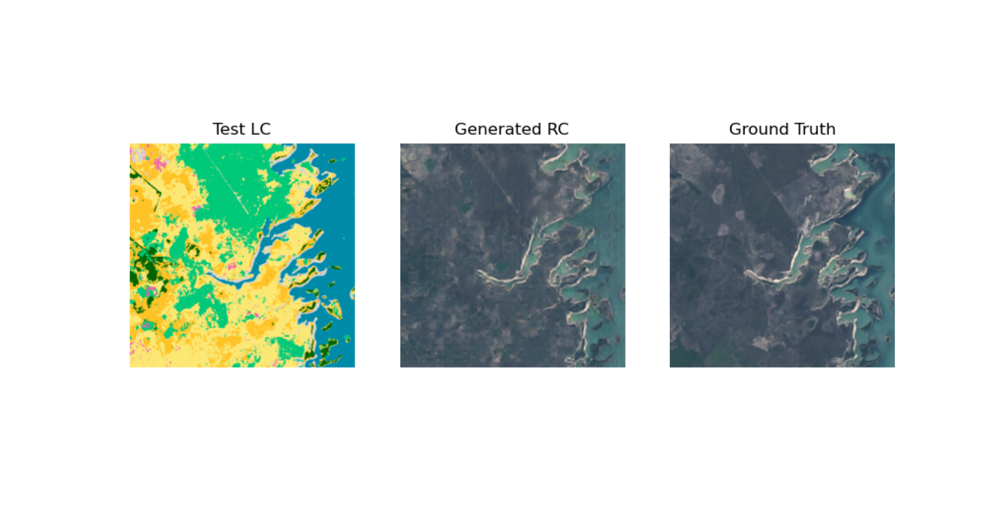

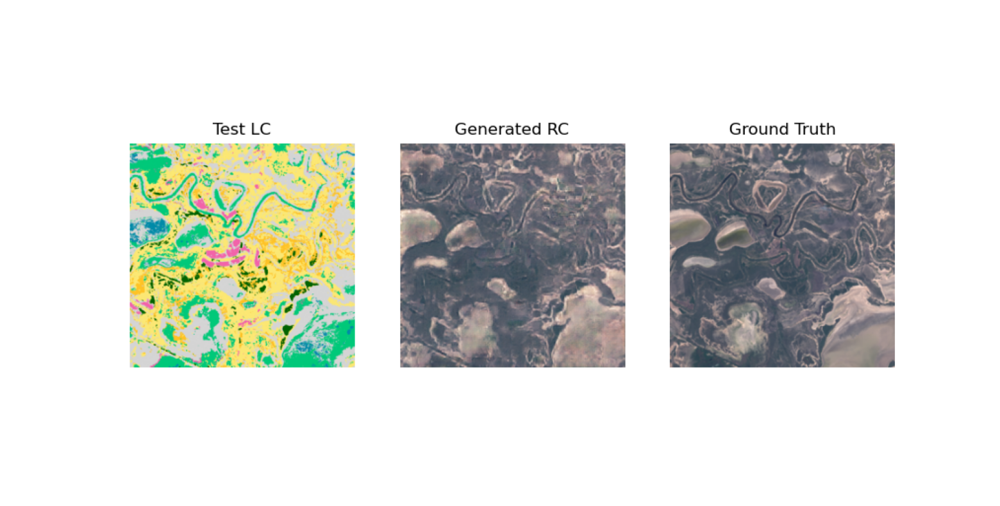

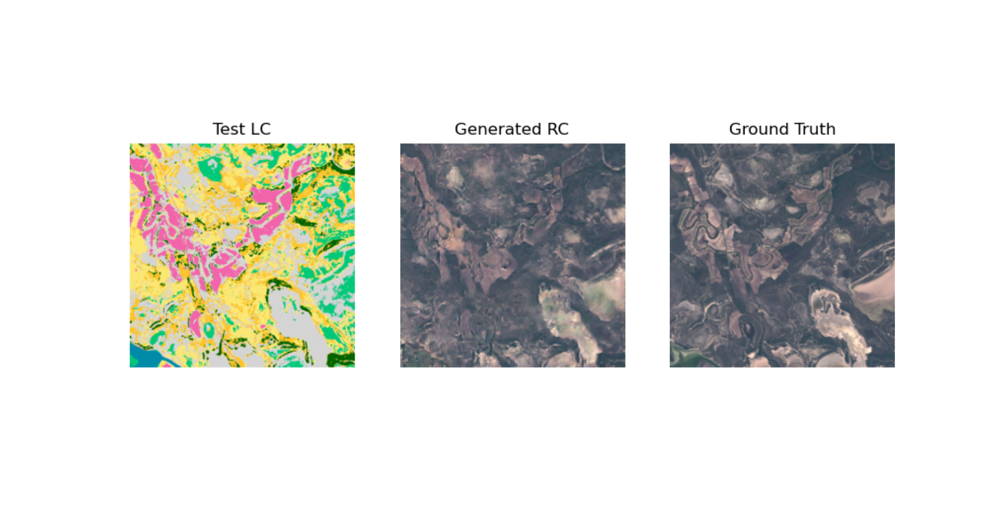

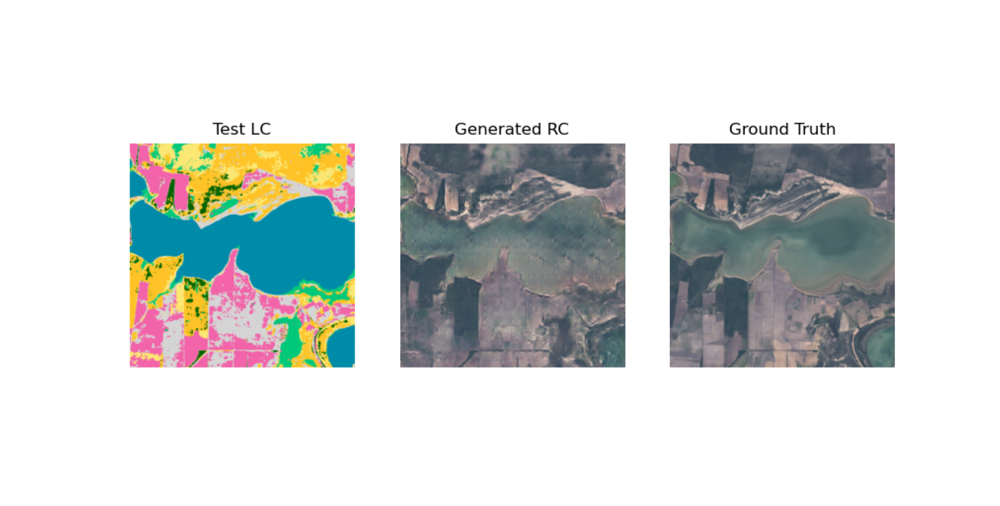

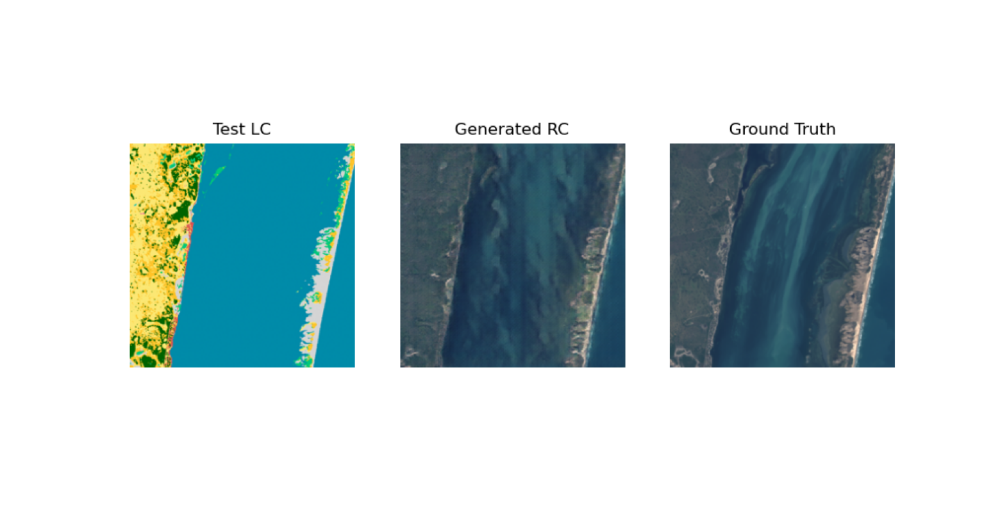

In [19]:
test_generation_path = '24-1204_training_images_2/test_generation'
test_generation_files = [file for file in os.listdir(test_generation_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

for i, filename in enumerate(test_generation_files[:5]):
    img_path = os.path.join(test_generation_path, filename)
    img = Image.open(img_path)

    fig, ax = plt.subplots(figsize=(20, 10)) 
    ax.imshow(img)
    ax.axis('off') 

    plt.show()

## Step 3

<strong style="color: #CD6AA3;">We can also modify the land cover images slightly to simulate the satellite image when human behavior has made changes to the landscape.</strong> We could either do this manually, or by the following code chunk which provides a function that let certain land cover types buffer from their original areas. In the provided example, the “cropland” areas are buffered by 10 pixels. (Since pixel_scale = 10, this would mean expanding by 100 meters.) Some areas are excluded from the buffer, including already built-up areas and water bodies. The modified images are stored at test_lc_path2.

In [ ]:
#| eval: false

def modify_landcover_around_class(
    input_image_path, 
    output_image_path, 
    target_class, 
    replacement_class, 
    protected_classes,
    buffer_distance=10, 
    modification_probability=1
):

    img = Image.open(input_image_path)
    img_array = np.array(img)
    
    target_mask = np.all(img_array == target_class, axis=2)
    
    protection_mask = np.zeros_like(target_mask, dtype=bool)
    for protected_class in protected_classes:
        protection_mask |= np.all(img_array == protected_class, axis=2)
    
    buffer_mask = np.zeros_like(target_mask)
    height, width = target_mask.shape
    
    for y in range(height):
        for x in range(width):
            if target_mask[y, x]:
                y_min = max(0, y - buffer_distance)
                y_max = min(height, y + buffer_distance + 1)
                x_min = max(0, x - buffer_distance)
                x_max = min(width, x + buffer_distance + 1)
                
                buffer_mask[y_min:y_max, x_min:x_max] = 1
    
    buffer_mask = buffer_mask & ~target_mask & ~protection_mask
    
    modified_img = img_array.copy()
    
    for y in range(height):
        for x in range(width):
            if buffer_mask[y, x] and random.random() < modification_probability:
                modified_img[y, x] = replacement_class
    
    modified_image = Image.fromarray(modified_img)
    modified_image.save(output_image_path)

def process_directory(input_dir, output_dir, target_class, replacement_class, protected_classes):
    os.makedirs(output_dir, exist_ok=True)
    
    for filename in os.listdir(input_dir):
        if filename.endswith('.png'):
            input_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename)
            
            try:
                modify_landcover_around_class(
                    input_path,
                    output_path,
                    target_class,
                    replacement_class,
                    protected_classes
                )
                print(f"Processed {filename}")
            except Exception as e:
                print(f"Error processing {filename}: {e}")

LANDCOVER_CLASSES = {
    'tree_cover': (0, 100, 0),      # Dark Green
    'shrubland': (255, 195, 39),    # Orange
    'grassland': (252, 232, 116),    # Yellow
    'cropland': (243, 100, 170),    # Pink
    'built_up': (219, 80, 80),        # Red
    'bare': (213, 213, 213),        # Grey
    'snow_ice': (240, 240, 240),    # White
    'water': (0, 100, 200),         # Blue
    'wetland': (0, 139, 169),       # Teal
    'mangroves': (0, 201, 122),     # Light Green
    'moss_lichen': (250, 230, 160)  # Beige
}

if __name__ == "__main__":
    test_lc_path = "24-1204_training_images_2/LC_test"
    test_lc_path2 = "24-1204_training_images_2/LC_test_modified"
    
    protected_classes = [
        LANDCOVER_CLASSES['built_up'],
        LANDCOVER_CLASSES['wetland'],
        LANDCOVER_CLASSES['water'],
    ]
    
    process_directory(
        test_lc_path,
        test_lc_path2,
        target_class=LANDCOVER_CLASSES['cropland'],
        replacement_class=LANDCOVER_CLASSES['cropland'],
        protected_classes=protected_classes
    )

We can check the results of our modified images by running the following block:

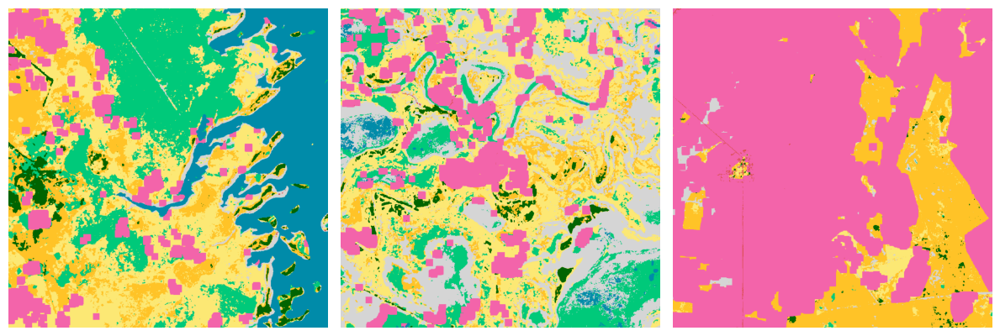

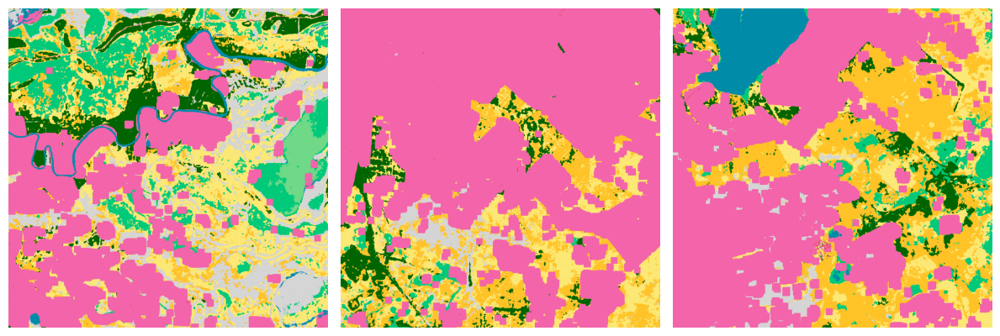

In [31]:
test_lc_path2 = "24-1204_training_images_2/LC_test_modified"

test_lc_path2_files = sorted([file for file in os.listdir(test_lc_path2) if file.endswith(('.png', '.jpg', '.jpeg'))])

for i in range(0, len(test_lc_path2_files), 3):
    if i + 1 >= len(test_lc_path2_files):
        break
    
    img_path1 = os.path.join(test_lc_path2, test_lc_path2_files[i])
    img_path2 = os.path.join(test_lc_path2, test_lc_path2_files[i + 1])
    img_path3 = os.path.join(test_lc_path2, test_lc_path2_files[i + 2])
    
    img1 = Image.open(img_path1)
    img2 = Image.open(img_path2)
    img3 = Image.open(img_path3)
    
    fig, axes = plt.subplots(1, 3, figsize=(12, 6))
    axes[0].imshow(img1)
    axes[0].axis('off')  
    
    axes[1].imshow(img2)
    axes[1].axis('off')  

    axes[2].imshow(img3)
    axes[2].axis('off')  
    
    plt.tight_layout()
    plt.show()

## Step 4

<strong style="color: #CD6AA3;">To compare how modified land cover types possibly impact on satellite views,</strong> we can run this generate_composite_image() function to generate a side-by-side comparison image between images of original land cover, modified land cover, generated satellite from original land cover, generated satellite from modified land cover and real satellite images. The generated images are saved at test_generation_path2.

In [ ]:
#| eval: false

model = generator

test_lc_path = '24-1204_training_images_2/LC_test'
test_lc_path2 = '24-1204_training_images_2/LC_test_modified'
ground_truth_path = '24-1204_training_images_2/RC_test'
test_generation_path2 = '24-1204_training_images_2/test_modified_generation'

os.makedirs(test_generation_path2, exist_ok=True)

def generate_composite_image(model, lc_input, test_lc_input, ground_truth, save_path):
    generated_lc = model(lc_input, training=True)
    generated_lc_test = model(test_lc_input, training=True)

    plt.figure(figsize=(25, 5))
    display_list = [lc_input[0], test_lc_input[0], generated_lc[0], generated_lc_test[0], ground_truth[0]]
    titles = ['Input LC', 'Modified LC', 'Generated RC', 'Generated RC from Modified LC', 'Ground Truth']

    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.title(titles[i])
        plt.imshow((display_list[i] * 0.5) + 0.5)
        plt.axis('off')

    plt.savefig(save_path)
    plt.close()
    print(f'Saved composite image: {save_path}')

for image_file in os.listdir(test_lc_path):
    if image_file.endswith('.jpg') or image_file.endswith('.png'):
        test_lc_image_path = os.path.join(test_lc_path, image_file)
        test_lc_image_path2 = os.path.join(test_lc_path2, image_file)
        ground_truth_image_path = os.path.join(ground_truth_path, image_file)

        if os.path.exists(test_lc_image_path2) and os.path.exists(ground_truth_image_path):
            test_lc_image = preprocess_image(test_lc_image_path)
            test_lc_image2 = preprocess_image(test_lc_image_path2)
            ground_truth_image = preprocess_image(ground_truth_image_path)

            composite_image_path2 = os.path.join(test_generation_path2, image_file)
            generate_composite_image(model, test_lc_image, test_lc_image2, ground_truth_image, composite_image_path2)

We can then run the following code chunk to view some of the generated images in notebook:

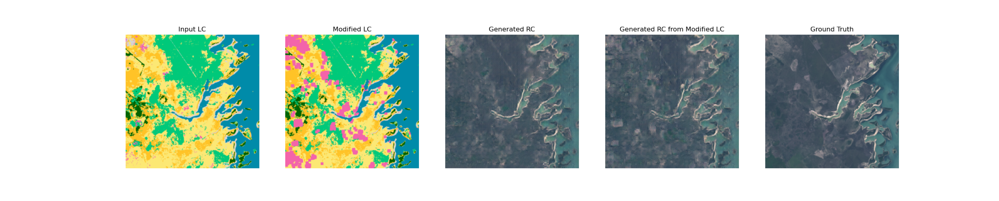

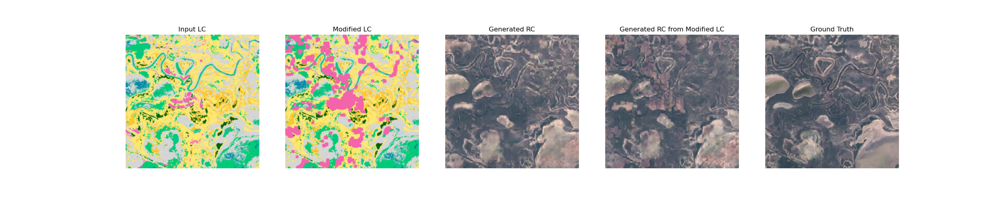

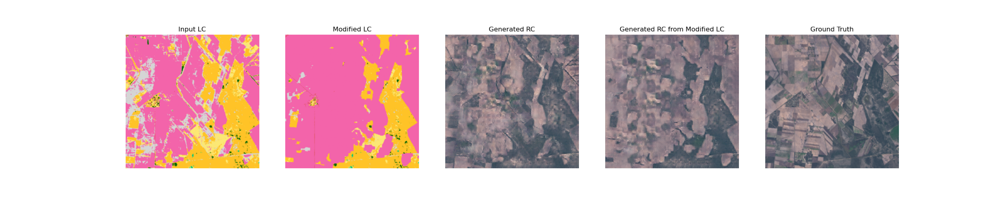

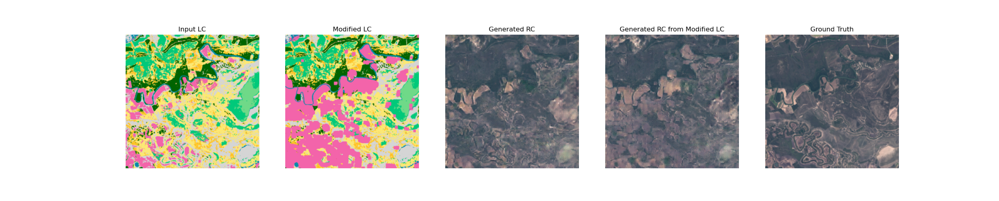

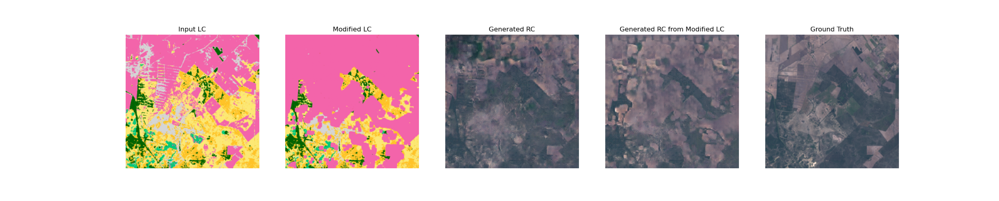

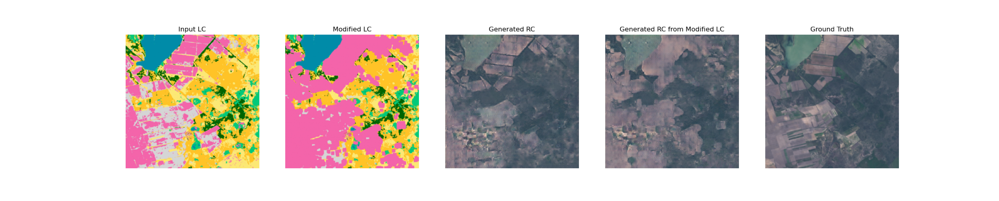

In [29]:
test_generation_path2 = '24-1204_training_images_2/test_modified_generation'

test_generation_path2_files = [file for file in os.listdir(test_generation_path2) if file.endswith(('.png', '.jpg', '.jpeg'))]

for i, filename in enumerate(test_generation_path2_files[:6]):
    img_path = os.path.join(test_generation_path2, filename)
    img = Image.open(img_path)

    fig, ax = plt.subplots(figsize=(160, 80)) 
    ax.imshow(img)
    ax.axis('off') 

    plt.show()